In [124]:
import pandas as pd
from transformers import AutoTokenizer, AutoModel
from dataset.dataset import create_loaders
from prettytable import PrettyTable
from tqdm import tqdm
import numpy as np
import torch
import gc
import os

In [196]:
sns.set_style("whitegrid")

1. ## Analyzing Amazon-Review Dataset

In [16]:
task='sa'

In [8]:
models = ['bert-base-uncased', 'distilbert-base-uncased', 'roberta-base', 'distilroberta-base']

In [10]:
def create_model(model_name):
    model = AutoModel.from_pretrained(pretrained_model_name_or_path=model_name)
    # freeze the weights
    for param in model.parameters():
        param.requires_grad = False
    return model

In [14]:
model_name = models[0]

In [17]:
tokenizer = AutoTokenizer.from_pretrained(model_name, usefast=True, use_lower_case=True)
loaders = create_loaders(task=task, tokenizer=tokenizer)

Using custom data configuration default
Reusing dataset csv (/home/macab/.cache/huggingface/datasets/csv/default-55a41fe2aee0eb3a/0.0.0/49187751790fa4d820300fd4d0707896e5b941f1a9c644652645b866716a4ac4)
Using custom data configuration default
Reusing dataset csv (/home/macab/.cache/huggingface/datasets/csv/default-54574eb2420d8965/0.0.0/49187751790fa4d820300fd4d0707896e5b941f1a9c644652645b866716a4ac4)
Using custom data configuration default
Reusing dataset csv (/home/macab/.cache/huggingface/datasets/csv/default-b4b36047175548aa/0.0.0/49187751790fa4d820300fd4d0707896e5b941f1a9c644652645b866716a4ac4)
Using custom data configuration default
Reusing dataset csv (/home/macab/.cache/huggingface/datasets/csv/default-6a65ee451571edfc/0.0.0/49187751790fa4d820300fd4d0707896e5b941f1a9c644652645b866716a4ac4)
Using custom data configuration default
Reusing dataset csv (/home/macab/.cache/huggingface/datasets/csv/default-323ff2fd59294775/0.0.0/49187751790fa4d820300fd4d0707896e5b941f1a9c644652645b866

In [41]:
model = create_model(model_name=models[0])


In [94]:

data = {}
for model_name in tqdm(models):

    tokenizer = AutoTokenizer.from_pretrained(model_name, usefast=True, use_lower_case=True)
    loaders = create_loaders(task=task, tokenizer=tokenizer)
    model = create_model(model_name=model_name)

    for domain in tqdm(loaders):
        representation = torch.empty((0, 768))
        for batch in loaders[domain]['valid']:
            
            outputs = model(input_ids=batch['input_ids'], attention_mask=batch['attention_mask'])
            representation = torch.vstack((representation, outputs[0][:, 0]))

            
        if model_name in data.keys():
            data[model_name].update({
                domain:representation
            })
        else:
            data[model_name] = {
                domain:representation
            }

        del representation
        gc.collect()

    del model
    gc.collect()



  0%|          | 0/4 [00:00<?, ?it/s]Using custom data configuration default
Reusing dataset csv (/home/macab/.cache/huggingface/datasets/csv/default-55a41fe2aee0eb3a/0.0.0/49187751790fa4d820300fd4d0707896e5b941f1a9c644652645b866716a4ac4)
Using custom data configuration default
Reusing dataset csv (/home/macab/.cache/huggingface/datasets/csv/default-54574eb2420d8965/0.0.0/49187751790fa4d820300fd4d0707896e5b941f1a9c644652645b866716a4ac4)
Using custom data configuration default
Reusing dataset csv (/home/macab/.cache/huggingface/datasets/csv/default-b4b36047175548aa/0.0.0/49187751790fa4d820300fd4d0707896e5b941f1a9c644652645b866716a4ac4)
Using custom data configuration default
Reusing dataset csv (/home/macab/.cache/huggingface/datasets/csv/default-6a65ee451571edfc/0.0.0/49187751790fa4d820300fd4d0707896e5b941f1a9c644652645b866716a4ac4)
Using custom data configuration default
Reusing dataset csv (/home/macab/.cache/huggingface/datasets/csv/default-323ff2fd59294775/0.0.0/49187751790fa4d8203

### Save the data

In [97]:
for model in data.keys():
    model_path = os.path.join(os.getcwd(), "representations", task+"-amazon-review", model)
    os.makedirs(model_path, exist_ok=True)
    for domain in data[model].keys():
        torch.save(data[model][domain], os.path.join(model_path, domain+".pt"))


In [104]:
model_representation = {}
for model in data.keys():
    d = []
    representations = torch.empty((0, 768))
    for domain in data[model].keys():
        representations = torch.vstack((representations, data[model][domain]))
        d += [domain]*data[model][domain].shape[0]
    model_representation[model] = {
        "representations":representations,
        "domains":d
    }
    del representations
    gc.collect()
    


In [105]:
for model in model_representation.keys():
    print(model_representation[model]['representations'].shape)

torch.Size([1200, 768])
torch.Size([1200, 768])
torch.Size([1200, 768])
torch.Size([1200, 768])


### Applying Dimensionaltiy reduction

In [73]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

In [74]:
sns.set_style("darkgrid")

In [107]:
dfs = []

for model in tqdm(model_representation.keys()):
    representations = model_representation[model]['representations']
    tsne = TSNE(n_components=2)
    pca = PCA(n_components=2)
    tsne_components = tsne.fit_transform(X=representations.numpy())
    pca_components = pca.fit_transform(X=representations.numpy())
    # model_representation[model]['tsne_components']=tsne_components
    # model_representation[model]['pca_components']=pca_components

    df = pd.DataFrame(
        data={
            "model":[model]*representations.shape[0],
            "domain":model_representation[model]['domains'],
            "tsne_0":tsne_components[:, 0],
            "tsne_1":tsne_components[:, 1],
            "pca_0":pca_components[:, 0],
            "pca_1":pca_components[:, 1]
        }
    )

    dfs.append(df)

100%|██████████| 4/4 [00:12<00:00,  3.12s/it]


In [109]:
## concat all the dataframes
df = pd.concat(dfs)

In [114]:
df.head(2)

,model,domain,tsne_0,tsne_1,pca_0,pca_1
0,bert-base-uncased,books,-10.670081,-31.933619,-1.231378,3.963461
1,bert-base-uncased,books,19.652704,28.275833,5.005237,0.633418


In [113]:
df['model'].value_counts()

distilbert-base-uncased    1200
bert-base-uncased          1200
roberta-base               1200
distilroberta-base         1200
Name: model, dtype: int64

In [112]:
## save the dataframe
df.to_csv("./representations/sa-amazon-review/pca-tsne-representation.csv", index=False)

### Visualization

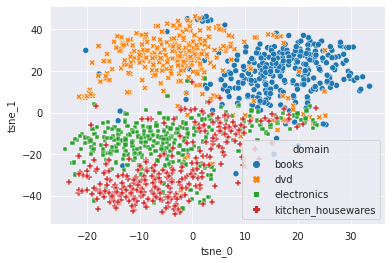

In [116]:
sns.scatterplot(data=df[df['model']=='distilbert-base-uncased'], x="tsne_0", y="tsne_1", hue="domain", style="domain")

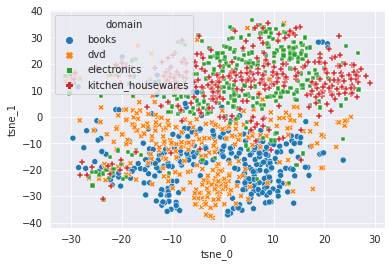

In [117]:
sns.scatterplot(data=df[df['model']=='bert-base-uncased'], x="tsne_0", y="tsne_1", hue="domain", style="domain")

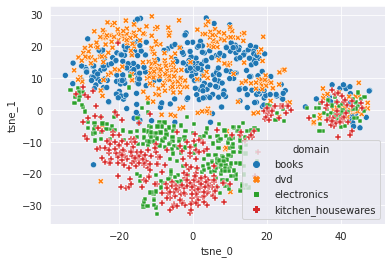

In [118]:
sns.scatterplot(data=df[df['model']=='roberta-base'], x="tsne_0", y="tsne_1", hue="domain", style="domain")

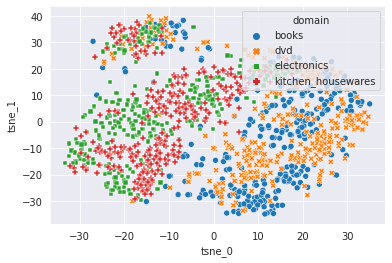

In [119]:
sns.scatterplot(data=df[df['model']=='distilroberta-base'], x="tsne_0", y="tsne_1", hue="domain", style="domain")

[None, None, None, None, None, None, None, None]

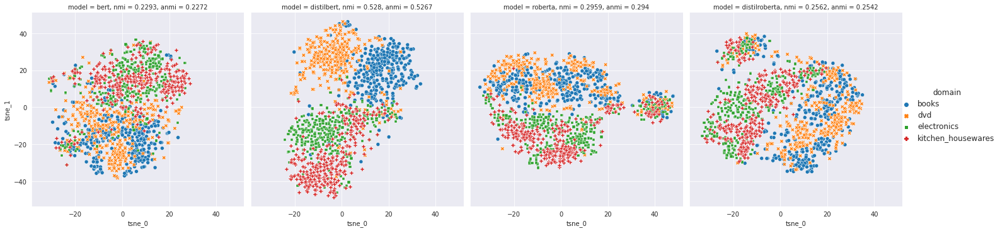

In [186]:
ax = sns.relplot(
    data=df, x="tsne_0", y="tsne_1",
    col="model", hue="domain", style="domain",
    kind="scatter"
)
plt.setp(ax._legend.get_title(), fontsize=12)
plt.setp(ax._legend.get_texts(), fontsize=12)

In [123]:
# sns.relplot(
#     data=df, x="pca_0", y="pca_1",
#     col="model", hue="domain", style="domain",
#     kind="scatter"
# )

### Compute NMI and ANMI

In [128]:
df['domain'].value_counts()

dvd                   1200
books                 1200
kitchen_housewares    1200
electronics           1200
Name: domain, dtype: int64

In [151]:
mutual_information = {

}

In [161]:
for model in tqdm(models):

    x1, x2 = df[df['model']==model]['tsne_0'].values.reshape(-1, 1), df[df['model']==model]['tsne_1'].values.reshape(-1, 1)
    x = np.concatenate((x1, x2), axis=1)
    y = df[df['model']==model]['domain'].apply(lambda domain:domain_dict[domain]).values

    kmeans = KMeans(n_clusters=4, random_state=42).fit(x)

    labels_true = y #kmeans.labels_
    labels_pred = kmeans.predict(x)

    nmi = normalized_mutual_info_score(labels_true=labels_true,  labels_pred=labels_pred)
    anmi = adjusted_mutual_info_score(labels_true=labels_true,  labels_pred=labels_pred)


    mutual_information[model] = {
        "nmi":round(nmi, 4),
        "anmi":round(anmi, 4)
    }


    




100%|██████████| 4/4 [00:00<00:00, 18.80it/s]


In [162]:
print(mutual_information)

{'bert-base-uncased': {'nmi': 0.2293, 'anmi': 0.2272}, 'distilbert-base-uncased': {'nmi': 0.528, 'anmi': 0.5267}, 'roberta-base': {'nmi': 0.2959, 'anmi': 0.294}, 'distilroberta-base': {'nmi': 0.2562, 'anmi': 0.2542}}


In [163]:
df_ = df.copy()

In [173]:
df = df_.copy()

In [174]:
df['model'] = df['model'].apply(lambda x: x.split("-")[0]+ ", nmi = " + str(mutual_information[x]['nmi']) + ", anmi = " + str(mutual_information[x]['anmi']))

In [171]:
df.head(1)

,model,domain,tsne_0,tsne_1,pca_0,pca_1
0,"bert, nmi = 0.2562, anmi = 0.2542",books,-10.670081,-31.933619,-1.231378,3.963461


In [193]:
sns.color_palette("tab10")

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

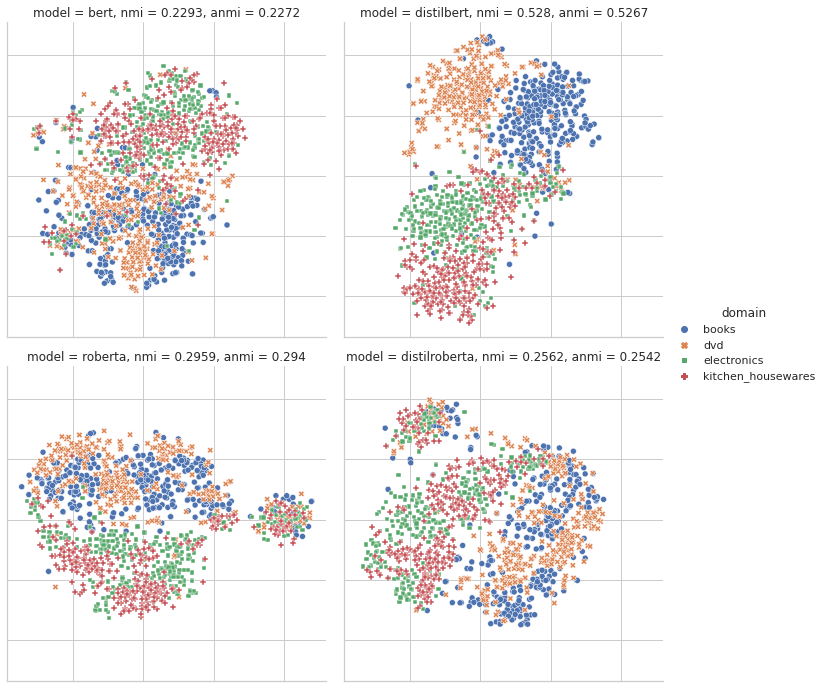

In [197]:
ax = sns.relplot(
    data=df, x="tsne_0", y="tsne_1",
    col="model", hue="domain", style="domain",
    kind="scatter",
    col_wrap=2,
    palette="deep"
)
ax.set_xlabels("")
ax.set_ylabels("")

ax.set(xticklabels=[])
ax.set(yticklabels=[])


## 2.  SST-2 vs IMDB Movie Review Analysis

In [1]:
from datasets import load_dataset
import glob as glob
import torch
from transformers import AutoTokenizer
import pandas as pd
from transformers import AutoTokenizer, AutoModel
from dataset.dataset import create_loaders
from prettytable import PrettyTable
from tqdm import tqdm
import numpy as np
import torch
import gc
import os
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import normalized_mutual_info_score, adjusted_mutual_info_score


/home/macab/miniconda3/lib/python3.8/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() > 0


In [3]:
# dataset_imdb['train'].select(range(1000))

In [4]:
# 

In [4]:
def create_imdb_sst2_loader(tokenizer):

    loaders = {}

    # load sst2
    dataset_sst2 = load_dataset("toriving/sst2")
    # train_sst2 = dataset_sst2['train']
    # valid_sst2 = dataset_sst2['validation']
    test_sst2 = dataset_sst2['test'].select(range(1000))

    # load imdb
    dataset_imdb = load_dataset("imdb")
    # train_imdb = dataset_imdb['train']
    # valid_imdb = dataset_imdb['test']
    test_imdb = dataset_imdb['test'].select(range(1000))



    

    # # encode sst2 
    # encoded_train_sst2 = train_sst2.map(lambda x: tokenizer(x['text'], padding='max_length',           truncation=True, max_length=config['max_seq_length']), batched=True)

    # encoded_valid_sst2 = valid_sst2.map(lambda x: tokenizer(x['text'], padding='max_length',           truncation=True, max_length=config['max_seq_length']), batched=True)

    encoded_test_sst2 = test_sst2.map(lambda x: tokenizer(x['text'], padding='max_length',             truncation=True, max_length=config['max_seq_length']), batched=True)

    # # encode imdb
    # encoded_train_imdb = train_imdb.map(lambda x: tokenizer(x['text'], padding='max_length',           truncation=True, max_length=config['max_seq_length']), batched=True)
    # encoded_valid_imdb = valid_imdb.map(lambda x: tokenizer(x['text'], padding='max_length',           truncation=True, max_length=config['max_seq_length']), batched=True)
    encoded_test_imdb = test_imdb.map(lambda x: tokenizer(x['text'], padding='max_length',             truncation=True, max_length=config['max_seq_length']), batched=True)



    # encoded_train_sst2.set_format(type='torch', columns=['input_ids', 'attention_mask', 'label'])
    # encoded_valid_sst2.set_format(type='torch', columns=['input_ids', 'attention_mask', 'label'])
    encoded_test_sst2.set_format(type='torch', columns=['input_ids', 'attention_mask', 'label'])

    # encoded_train_imdb.set_format(type='torch', columns=['input_ids', 'attention_mask', 'label'])
    # encoded_valid_imdb.set_format(type='torch', columns=['input_ids', 'attention_mask', 'label'])
    encoded_test_imdb.set_format(type='torch', columns=['input_ids', 'attention_mask', 'label'])


    # # create loaders for sst2
    # train_dataloader_sst2 = torch.utils.data.DataLoader(dataset = encoded_train_sst2, batch_size=config              ['tasks']['sa']["batch_size"], shuffle=True, num_workers=4)
    # valid_dataloader_sst2 = torch.utils.data.DataLoader(dataset = encoded_valid_sst2, batch_size=config              ['tasks']['sa']["batch_size"], shuffle=False, num_workers=4)
    test_dataloader_sst2 = torch.utils.data.DataLoader(dataset = encoded_test_sst2, batch_size=config                ['tasks']['sa']["batch_size"], shuffle=False, num_workers=4)

    # # create loaders for imdb2
    # train_dataloader_imdb = torch.utils.data.DataLoader(dataset = encoded_train_imdb, batch_size=config              ['tasks']['sa']["batch_size"], shuffle=True, num_workers=4)
    # valid_dataloader_imdb = torch.utils.data.DataLoader(dataset = encoded_valid_imdb, batch_size=config              ['tasks']['sa']["batch_size"], shuffle=False, num_workers=4)
    test_dataloader_imdb = torch.utils.data.DataLoader(dataset = encoded_test_imdb, batch_size=config                ['tasks']['sa']["batch_size"], shuffle=False, num_workers=4)

    loaders['sst2'] = {
        "train": test_dataloader_imdb, #train_dataloader_imdb,
        "valid": test_dataloader_imdb, #valid_dataloader_imdb,
        "test": test_dataloader_imdb,
    }

    loaders['imdb'] = {
        "train": test_dataloader_sst2, #train_dataloader_sst2,
        "valid": test_dataloader_sst2, #valid_dataloader_sst2,
        "test": test_dataloader_sst2,
    }

    return loaders

In [5]:
config = {
    "max_seq_length":512,
    "tasks":{
        "sa":{
            "batch_size":32,
        }
    }
}

In [6]:
task='sa-imdb_sst2'

In [7]:
models = ['bert-base-uncased', 'distilbert-base-uncased', 'roberta-base', 'distilroberta-base']

In [8]:
def create_model(model_name):
    model = AutoModel.from_pretrained(pretrained_model_name_or_path=model_name)
    # freeze the weights
    for param in model.parameters():
        param.requires_grad = False
    return model

In [9]:

data = {}
for model_name in tqdm(models):

    tokenizer = AutoTokenizer.from_pretrained(model_name, usefast=True, use_lower_case=True)
    loaders = create_imdb_sst2_loader(tokenizer=tokenizer)
    model = create_model(model_name=model_name)

    for domain in tqdm(loaders):
        representation = torch.empty((0, 768))

        for batch in tqdm(loaders[domain]['valid']):
            
            outputs = model(input_ids=batch['input_ids'], attention_mask=batch['attention_mask'])
            representation = torch.vstack((representation, outputs[0][:, 0]))

            
        if model_name in data.keys():
            data[model_name].update({
                domain:representation
            })
        else:
            data[model_name] = {
                domain:representation
            }

        del representation
        gc.collect()

    del model
    gc.collect()



  0%|          | 0/4 [00:00<?, ?it/s]Using custom data configuration default
Reusing dataset ss_t2 (/home/macab/.cache/huggingface/datasets/ss_t2/default/0.0.0/90167692658fa4abca2ffa3ede1a43a71e2bf671078c5c275c64c4231d5a62fa)
Reusing dataset imdb (/home/macab/.cache/huggingface/datasets/imdb/plain_text/1.0.0/4ea52f2e58a08dbc12c2bd52d0d92b30b88c00230b4522801b3636782f625c5b)

100%|██████████| 1/1 [00:00<00:00,  2.04ba/s]

100%|██████████| 1/1 [00:03<00:00,  3.73s/ba]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  3%|▎         | 1/32 [00:14<07:20, 14.20s/it]

  6%|▋         | 2/32 [00:28<07:03, 14.12s/it]

  9%|▉         | 3/32 [00:42<06:48, 14.10s/it]

 12%|█▎        | 4/32 [00:56<06:34, 14.08s/it]

 16%|█▌        | 5/32 [01:10<06:25, 14.28s/it]

 19%|█▉        | 6/32 [01:25<06:12, 14.33s/it]

 22%|██▏       | 7/32 [01:39<05:59, 14.37s/it]

 25%|██▌       | 8/32 [01:54<05:47, 14.46s/it]

 28%|██▊       | 9/32 [02:08<05:28, 14.30s/it]

 31%|███▏      | 1

### Save the represenation

In [10]:
for model in data.keys():
    model_path = os.path.join(os.getcwd(), "representations", task, model)
    os.makedirs(model_path, exist_ok=True)
    for domain in data[model].keys():
        torch.save(data[model][domain], os.path.join(model_path, domain+".pt"))


In [11]:
model_representation = {}
for model in data.keys():
    d = []
    representations = torch.empty((0, 768))
    for domain in data[model].keys():
        representations = torch.vstack((representations, data[model][domain]))
        d += [domain]*data[model][domain].shape[0]
    model_representation[model] = {
        "representations":representations,
        "domains":d
    }
    del representations
    gc.collect()

In [12]:
for model in model_representation.keys():
    print(model_representation[model]['representations'].shape)

torch.Size([2000, 768])
torch.Size([2000, 768])
torch.Size([2000, 768])
torch.Size([2000, 768])


#### Dimensionality Reduction

In [13]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

In [24]:
sns.set_style("darkgrid")

In [14]:
dfs = []

for model in tqdm(model_representation.keys()):
    representations = model_representation[model]['representations']
    tsne = TSNE(n_components=2)
    pca = PCA(n_components=2)
    tsne_components = tsne.fit_transform(X=representations.numpy())
    pca_components = pca.fit_transform(X=representations.numpy())
    # model_representation[model]['tsne_components']=tsne_components
    # model_representation[model]['pca_components']=pca_components

    df = pd.DataFrame(
        data={
            "model":[model]*representations.shape[0],
            "domain":model_representation[model]['domains'],
            "tsne_0":tsne_components[:, 0],
            "tsne_1":tsne_components[:, 1],
            "pca_0":pca_components[:, 0],
            "pca_1":pca_components[:, 1]
        }
    )

    dfs.append(df)

100%|██████████| 4/4 [00:26<00:00,  6.66s/it]


In [15]:
## concat all the dataframes
df = pd.concat(dfs)

In [16]:
df.head()

,model,domain,tsne_0,tsne_1,pca_0,pca_1
0,bert-base-uncased,sst2,20.010035,-20.751608,4.082490,-2.684484
1,bert-base-uncased,sst2,-6.375462,-34.037914,4.480775,0.282209
2,bert-base-uncased,sst2,-10.897414,-38.612591,5.001299,2.667220
3,bert-base-uncased,sst2,-4.880717,-28.825159,0.923200,-1.008484
4,bert-base-uncased,sst2,-15.859238,-24.374420,1.258412,1.941943


In [17]:
## save the dataframe
df.to_csv("./representations/sa-imdb_sst2/pca-tsne-representation.csv", index=False)

In [26]:
df = pd.read_csv("./representations/sa-imdb_sst2/pca-tsne-representation.csv")

In [27]:
domain_dict = {
    "imdb":0,
    "sst2":1
}

In [28]:
mutual_information = {

}

In [31]:
for model in tqdm(models):

    x1, x2 = df[df['model']==model]['tsne_0'].values.reshape(-1, 1), df[df['model']==model]['tsne_1'].values.reshape(-1, 1)
    x = np.concatenate((x1, x2), axis=1)
    y = df[df['model']==model]['domain'].apply(lambda domain:domain_dict[domain]).values

    kmeans = KMeans(n_clusters=2, random_state=42).fit(x)

    labels_true = y #kmeans.labels_
    labels_pred = kmeans.predict(x)

    nmi = normalized_mutual_info_score(labels_true=labels_true,  labels_pred=labels_pred)
    anmi = adjusted_mutual_info_score(labels_true=labels_true,  labels_pred=labels_pred)


    mutual_information[model] = {
        "nmi":round(nmi, 4),
        "anmi":round(anmi, 4)
    }


100%|██████████| 4/4 [00:00<00:00, 40.40it/s]


In [32]:
df_ = df.copy()

In [33]:
df['model'] = df['model'].apply(lambda x: x.split("-")[0]+ ", nmi = " + str(mutual_information[x]['nmi']) + ", anmi = " + str(mutual_information[x]['anmi']))

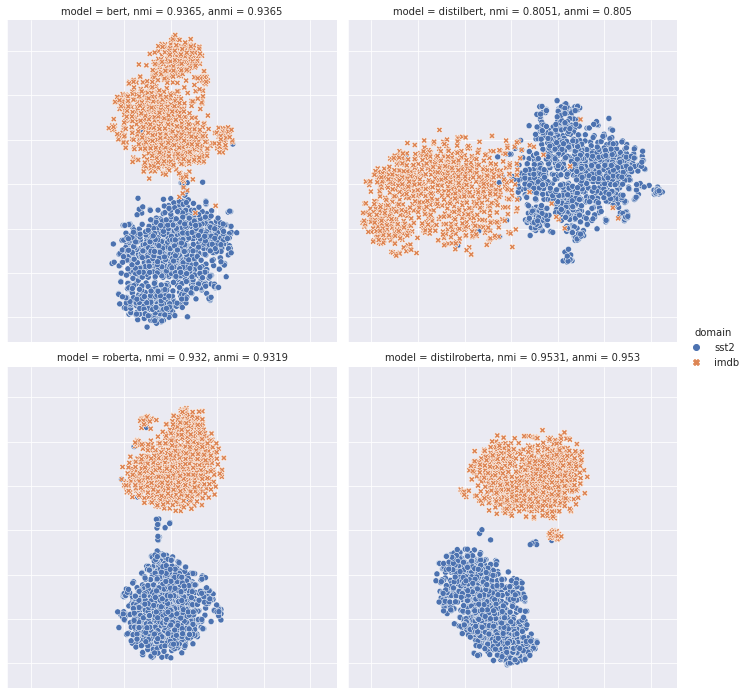

In [34]:
ax = sns.relplot(
    data=df, x="tsne_0", y="tsne_1",
    col="model", hue="domain", style="domain",
    kind="scatter",
    col_wrap=2,
    palette="deep",
    alpha=1,
)
ax.set_xlabels("")
ax.set_ylabels("")

ax.set(xticklabels=[])
ax.set(yticklabels=[])


## MNLI Represenation Analysis

In [1]:
from datasets import load_dataset
import glob as glob
import torch
from transformers import AutoTokenizer
import pandas as pd
from transformers import AutoTokenizer, AutoModel
from dataset.dataset import create_loaders
from prettytable import PrettyTable
from tqdm import tqdm
import numpy as np
import torch
import gc
import os
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import normalized_mutual_info_score, adjusted_mutual_info_score


/home/macab/miniconda3/lib/python3.8/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: CUDA unknown error - this may be due to an incorrectly set up environment, e.g. changing env variable CUDA_VISIBLE_DEVICES after program start. Setting the available devices to be zero. (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() > 0


In [2]:
task = "mnli"

In [3]:
models = ['bert-base-uncased', 'distilbert-base-uncased', 'roberta-base', 'distilroberta-base']

In [4]:
def create_model(model_name):
    model = AutoModel.from_pretrained(pretrained_model_name_or_path=model_name)
    # freeze the weights
    for param in model.parameters():
        param.requires_grad = False
    return model

In [5]:
data = {}
for model_name in tqdm(models):

    tokenizer = AutoTokenizer.from_pretrained(model_name, usefast=True, use_lower_case=True)
    loaders = create_loaders(task=task, tokenizer=tokenizer)
    model = create_model(model_name=model_name)

    for domain in tqdm(loaders):
        representation = torch.empty((0, 768))

        for batch in tqdm(loaders[domain]['valid']):
            
            outputs = model(input_ids=batch['input_ids'], attention_mask=batch['attention_mask'])
            representation = torch.vstack((representation, outputs[0][:, 0]))

            
        if model_name in data.keys():
            data[model_name].update({
                domain:representation
            })
        else:
            data[model_name] = {
                domain:representation
            }

        del representation
        gc.collect()

    del model
    gc.collect()



▏      | 5/16 [00:07<00:16,  1.46s/it]

 38%|███▊      | 6/16 [00:08<00:14,  1.44s/it]

 44%|████▍     | 7/16 [00:10<00:12,  1.44s/it]

 50%|█████     | 8/16 [00:11<00:11,  1.42s/it]

 56%|█████▋    | 9/16 [00:12<00:09,  1.39s/it]

 62%|██████▎   | 10/16 [00:14<00:08,  1.38s/it]

 69%|██████▉   | 11/16 [00:15<00:06,  1.37s/it]

 75%|███████▌  | 12/16 [00:17<00:05,  1.40s/it]

 81%|████████▏ | 13/16 [00:18<00:04,  1.40s/it]

 88%|████████▊ | 14/16 [00:20<00:02,  1.46s/it]

 94%|█████████▍| 15/16 [00:21<00:01,  1.43s/it]

100%|██████████| 16/16 [00:22<00:00,  1.40s/it]

 60%|██████    | 3/5 [01:07<00:44, 22.36s/it]

  0%|          | 0/16 [00:00<?, ?it/s]

  6%|▋         | 1/16 [00:01<00:25,  1.70s/it]

 12%|█▎        | 2/16 [00:03<00:22,  1.60s/it]

 19%|█▉        | 3/16 [00:04<00:20,  1.55s/it]

 25%|██▌       | 4/16 [00:05<00:18,  1.53s/it]

 31%|███▏      | 5/16 [00:07<00:16,  1.53s/it]

 38%|███▊      | 6/16 [00:08<00:14,  1.47s/it]

 44%|████▍     | 7/16 [00:10<00:13,  1.48s/it]

 5

### Save Representation

In [8]:
for model in data.keys():
    model_path = os.path.join(os.getcwd(), "representations", task, model)
    os.makedirs(model_path, exist_ok=True)
    for domain in data[model].keys():
        torch.save(data[model][domain], os.path.join(model_path, domain+".pt"))


In [9]:
model_representation = {}
for model in data.keys():
    d = []
    representations = torch.empty((0, 768))
    for domain in data[model].keys():
        representations = torch.vstack((representations, data[model][domain]))
        d += [domain]*data[model][domain].shape[0]
    model_representation[model] = {
        "representations":representations,
        "domains":d
    }
    del representations
    gc.collect()

In [10]:
for model in model_representation.keys():
    print(model_representation[model]['representations'].shape)

torch.Size([2500, 768])
torch.Size([2500, 768])
torch.Size([2500, 768])
torch.Size([2500, 768])


#### Dimensionality Reduction and plot

In [12]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

In [13]:
sns.set_style("darkgrid")

In [14]:
dfs = []

for model in tqdm(model_representation.keys()):
    representations = model_representation[model]['representations']
    tsne = TSNE(n_components=2)
    pca = PCA(n_components=2)
    tsne_components = tsne.fit_transform(X=representations.numpy())
    pca_components = pca.fit_transform(X=representations.numpy())
    # model_representation[model]['tsne_components']=tsne_components
    # model_representation[model]['pca_components']=pca_components

    df = pd.DataFrame(
        data={
            "model":[model]*representations.shape[0],
            "domain":model_representation[model]['domains'],
            "tsne_0":tsne_components[:, 0],
            "tsne_1":tsne_components[:, 1],
            "pca_0":pca_components[:, 0],
            "pca_1":pca_components[:, 1]
        }
    )

    dfs.append(df)

100%|██████████| 4/4 [00:27<00:00,  6.98s/it]


In [16]:
## concat all the dataframes
df = pd.concat(dfs)

In [17]:
df.head()

,model,domain,tsne_0,tsne_1,pca_0,pca_1
0,bert-base-uncased,government,-56.866009,7.959580,0.588749,-1.225942
1,bert-base-uncased,government,-40.843498,49.730148,2.825402,-1.075895
2,bert-base-uncased,government,-38.799824,34.463516,2.381283,-0.541054
3,bert-base-uncased,government,-52.675606,35.454960,2.197710,-2.472620
4,bert-base-uncased,government,-51.120766,45.599655,4.682797,-2.418928


In [18]:
## save the dataframe
df.to_csv("./representations/mnli/pca-tsne-representation.csv", index=False)

#### MI

In [19]:
domain

'slate'

In [20]:
domain_dict = {
    'government':0, 
    'telephone':1, 
    'fiction':2, 
    'travel':3, 
    'slate':4
}

In [21]:
mutual_information = {

}

In [22]:
for model in tqdm(models):

    x1, x2 = df[df['model']==model]['tsne_0'].values.reshape(-1, 1), df[df['model']==model]['tsne_1'].values.reshape(-1, 1)
    x = np.concatenate((x1, x2), axis=1)
    y = df[df['model']==model]['domain'].apply(lambda domain:domain_dict[domain]).values

    kmeans = KMeans(n_clusters=5, random_state=42).fit(x)

    labels_true = y #kmeans.labels_
    labels_pred = kmeans.predict(x)

    nmi = normalized_mutual_info_score(labels_true=labels_true,  labels_pred=labels_pred)
    anmi = adjusted_mutual_info_score(labels_true=labels_true,  labels_pred=labels_pred)


    mutual_information[model] = {
        "nmi":round(nmi, 4),
        "anmi":round(anmi, 4)
    }


100%|██████████| 4/4 [00:00<00:00, 11.11it/s]


In [23]:
df_ = df.copy()

In [24]:
df['model'] = df['model'].apply(lambda x: x.split("-")[0]+ ", nmi = " + str(mutual_information[x]['nmi']) + ", anmi = " + str(mutual_information[x]['anmi']))

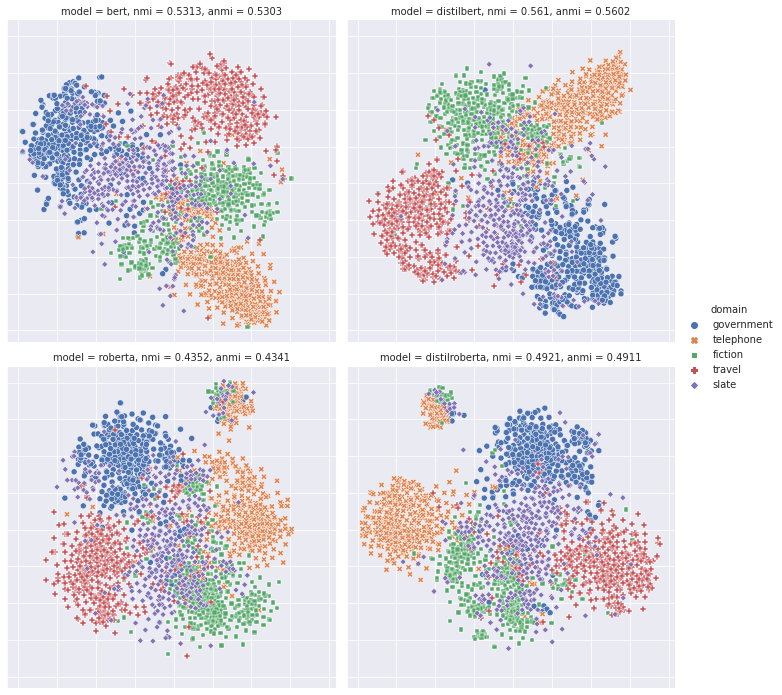

In [25]:
ax = sns.relplot(
    data=df, x="tsne_0", y="tsne_1",
    col="model", hue="domain", style="domain",
    kind="scatter",
    col_wrap=2,
    palette="deep",
    alpha=1,
)
ax.set_xlabels("")
ax.set_ylabels("")

ax.set(xticklabels=[])
ax.set(yticklabels=[])
